In [1]:
from IPython.display import HTML
from IPython.core.interactiveshell import InteractiveShell # makes all cells allow multiple outputs
from IPython.core.display import HTML, display
from IPython.display import IFrame
InteractiveShell.ast_node_interactivity = "all"
import matplotlib.pyplot as plt

%matplotlib inline

HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

Loading BokehJS ...


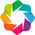

In [1]:
# Import common libraries
import pandas as pd
import numpy as np

import holoviews as hv
import geoviews as gv
import geoviews.feature as gf
import cartopy
import shapely as sh
import datashader as ds

from cartopy import crs as ccrs

from bokeh.tile_providers import STAMEN_TONER
from bokeh.models import WMTSTileSource
from bokeh.plotting import figure, output_file, show

from holoviews.operation.datashader import regrid, shade, datashade, dynspread
from bokeh.tile_providers import STAMEN_TONER

import geoviews.feature as gf

from bokeh.io import output_notebook

output_notebook()
hv.notebook_extension('bokeh')

acc_df = pd.read_pickle('./acc_df.pkl', compression='infer')
acc_df.drop(19230,inplace=True)

In [2]:
acc_df.tail()

,DATE_,GROUPE_ACCIDENT,COMMUNE,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,COOR_X,COOR_Y,ETAT_ROUTE,GENRE_ROUTE,...,DayTime,SEASON,CAUSE_g,CAUSE_sg,ENFANTS_IMPLIQUES,NB_MOTO,NB_BIKE,NB_TPubl,NB_ProfT,NB_LourdT
19225,2014-05-14,Accident lors d'un dépassement ou lors d'un ch...,Genève,Jour,Beau,Avec blessés légers,6.153109,46.203460,Humide,Route principale,...,Morning,Spring,Cause inconnue,Cause inconnue,0,0.0,1.0,0.0,0.0,0.0
19226,2014-04-21,Dérapage ou perte de maîtrise,Meinier,Nuit,Pluie,Avec blessés légers,6.230007,46.245047,Mouillée,Route secondaire,...,Night,Spring,Etat / intention du conducteur,Influence de l'alcool,0,1.0,0.0,0.0,0.0,0.0
19227,2014-04-08,Accident par tamponnement,Meyrin,Jour,Beau,Avec blessés légers,6.086021,46.225078,Sèche,Route principale,...,Afternoon,Spring,Autres mouvements dans la circulation,Suivre de trop près le véhicule qui précède,0,0.0,0.0,0.0,1.0,1.0
19228,2014-05-16,Dérapage ou perte de maîtrise,Vessy,Jour,Beau,Avec blessés graves,6.179751,46.177058,Sèche,Route principale,...,Morning,Spring,Inattention et distraction,Manque d'attention momentané,0,0.0,1.0,0.0,0.0,0.0
19229,2014-09-13,Dérapage ou perte de maîtrise,Genève,Jour,Beau,Avec blessés graves,6.165498,46.195090,Sèche,Route secondaire,...,Mid-day,Autumn,Inattention et distraction,Manque d'attention momentané,0,1.0,0.0,0.0,0.0,0.0


In [3]:
 
def latlng_to_meters(df, lat_name, lng_name):
    """
    Taken and modified from the datashader notebooks 
    """
    lat = df[lat_name]
    lng = df[lng_name]
    origin_shift = 2 * np.pi * 6378137 / 2.0
    mx = lng * origin_shift / 180.0
    my = np.log(np.tan((90 + lat) * np.pi / 360.0)) / (np.pi / 180.0)
    my = my * origin_shift / 180.0
    return df.assign(mx=mx).assign(my=my)

acc_df=acc_df.pipe(latlng_to_meters, "COOR_X", "COOR_Y")

from pyproj import Proj, transform
# projection definition
p1 = Proj(init='epsg:4326')
p2 = Proj(init='EPSG:3857')

# Helper functions
def coord_proj(acc_df,i, p1, p2):
    x1 = acc_df['COOR_X'].loc[i]
    y1 = acc_df['COOR_Y'].loc[i]
    x2, y2 = transform(p1,p2,x1,y1)
    acc_df['COOR_X'].set_value(i, x2)
    acc_df['COOR_Y'].set_value(i, y2)
    return acc_df

In [6]:
# Project data
for i in range(0, acc_df.shape[0]):
    coord_proj(acc_df,i, p1, p2)

In [7]:

acc_df.tail(2)

,DATE_,GROUPE_ACCIDENT,COMMUNE,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,COOR_X,COOR_Y,ETAT_ROUTE,GENRE_ROUTE,...,CAUSE_g,CAUSE_sg,ENFANTS_IMPLIQUES,NB_MOTO,NB_BIKE,NB_TPubl,NB_ProfT,NB_LourdT,mx,my
19228,2014-05-16,Dérapage ou perte de maîtrise,Vessy,Jour,Beau,Avec blessés graves,687926.770491,5.808768e+06,Sèche,Route principale,...,Inattention et distraction,Manque d'attention momentané,0,0.0,1.0,0.0,0.0,0.0,5.140407e+06,689264.453415
19229,2014-09-13,Dérapage ou perte de maîtrise,Genève,Jour,Beau,Avec blessés graves,686340.057934,5.811668e+06,Sèche,Route secondaire,...,Inattention et distraction,Manque d'attention momentané,0,1.0,0.0,0.0,0.0,0.0,5.142414e+06,687668.488168


In [8]:
mini_df = acc_df[['COOR_X', 'COOR_Y', 'CONDITIONS_LUMINEUSES', 'CONDITIONS_METEO','GROUPE_ACCIDENT','YEAR']]
mini_df.tail()

,COOR_X,COOR_Y,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,GROUPE_ACCIDENT,YEAR
19225,684960.932270,5.813014e+06,Jour,Beau,Accident lors d'un dépassement ou lors d'un ch...,2014
19226,693521.156505,5.819706e+06,Nuit,Pluie,Dérapage ou perte de maîtrise,2014
19227,677492.770115,5.816492e+06,Jour,Beau,Accident par tamponnement,2014
19228,687926.770491,5.808768e+06,Jour,Beau,Dérapage ou perte de maîtrise,2014
19229,686340.057934,5.811668e+06,Jour,Beau,Dérapage ou perte de maîtrise,2014


## COOL VISUALIZATION OF THE ACCIDENTS IN THE WHOLE CANTON IN ALL THE YEARS

In [9]:
years = list(range(2010,2017))
dictionary = {(year):hv.Points(mini_df[(mini_df.YEAR==year)], ['COOR_X','COOR_Y'])
              for year in years}
hv.Curve((years, [mini_df[mini_df['YEAR']==y].shape[0] for y in years]))

:Curve   [x]   (y)

In [10]:
%%opts Overlay [width=300 height=300 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
dynspread(datashade(dictionary[2010]))*geomap+\
dynspread(datashade(dictionary[2013]))*geomap+\
dynspread(datashade(dictionary[2016]))*geomap

/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:Layout
   .DynamicMap.I   :DynamicMap   []
   .DynamicMap.II  :DynamicMap   []
   .DynamicMap.III :DynamicMap   []

# LET'S GO FOR A DEEPER ANALYSIS OF THE ACCIDENTS IN GENEVE ONLY

In [11]:
%%output filename="timeseries"
%%opts Overlay [width=600 height=300 show_grid=True ] (background_alpha=1) 



lums_ = list(mini_df['CONDITIONS_LUMINEUSES'].value_counts().index)+['ALL']
meteos_ = list(mini_df['CONDITIONS_METEO'].value_counts().index)+['ALL']
jours_ = ['Lundi', 'Mardi', 'Mercredi', 'Jeudi','Vendredi', 'Samedi', 'Dimanche','ALL']

Geneve_df = acc_df[acc_df['COMMUNE']=='Genève'][['GROUPE_ACCIDENT', 'CONDITIONS_LUMINEUSES',
       'CONDITIONS_METEO', 'CONSEQUENCES', 'COOR_X', 'COOR_Y', 'JOUR','mx','my']]
Geneve_df.reset_index(inplace=True,drop=True)



def retrieve_Geneve_dataset(lum, jour):
    if (lum != 'ALL') & (jour != 'ALL'):
        return Geneve_df[(Geneve_df['CONDITIONS_LUMINEUSES']==lum) & (Geneve_df['JOUR']==jour)]
    if (lum == 'ALL') & (jour == 'ALL'):
        return Geneve_df
    if (lum == 'ALL'):
         return Geneve_df[Geneve_df['JOUR']==jour]
    if (jour == 'ALL'):
         return Geneve_df[Geneve_df['CONDITIONS_LUMINEUSES']==lum]


def Geneve_timeseries(lum):
    jour_IDS = [1,2,3,4,5,6,7]
    if lum!='ALL':
        return hv.Curve((jour_IDS, [Geneve_df[(Geneve_df['CONDITIONS_LUMINEUSES']==lum) &(Geneve_df['JOUR']==jours_[x-1])].shape[0] for x in jour_IDS],'days'  ))
    return hv.Curve((jour_IDS, [Geneve_df[Geneve_df['JOUR']==jours_[x-1]].shape[0] for x in jour_IDS]))


Geneve_dic = {(lum, jour) : 
              hv.Points( retrieve_Geneve_dataset(lum, jour), ['COOR_X','COOR_Y'], )
              for lum in lums_
              for jour in jours_}

timeseries_dict = {(lum):Geneve_timeseries(lum) for lum in lums_}

timeseries_dict['Jour']*\
timeseries_dict['Nuit']*\
timeseries_dict['ALL']

:Overlay
   .Curve.I   :Curve   [x]   (y)
   .Curve.II  :Curve   [x]   (y)
   .Curve.III :Curve   [x]   (y)

In [12]:
%%opts Overlay [width=500 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

dynspread(datashade(Geneve_dic['Jour','Lundi']))*geomap+\
dynspread(datashade(Geneve_dic['Nuit','Lundi']))*geomap

/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:Layout
   .DynamicMap.I  :DynamicMap   []
   .DynamicMap.II :DynamicMap   []

In [13]:
%%output filename="geneve"
%%opts Overlay [width=500 height=500 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

dynspread(datashade(Geneve_dic['Jour','Samedi']))*geomap+\
dynspread(datashade(Geneve_dic['Nuit','Samedi']))*geomap

/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:
/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:Layout
   .DynamicMap.I  :DynamicMap   []
   .DynamicMap.II :DynamicMap   []

In [14]:
%%opts Overlay [width=600 height=600 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts WMTS (alpha=0.05)

from bokeh.tile_providers import STAMEN_TONER
    
geomap = gv.WMTS(STAMEN_TONER)
geomap*dynspread(datashade(hv.Points(Geneve_df,['COOR_X','COOR_Y'])))


/home/zampieri/anaconda3/lib/python3.6/site-packages/holoviews/operation/datashader.py:358: FutureWarning: xarray.DataArray.__contains__ currently checks membership in DataArray.coords, but in xarray v0.11 will change to check membership in array values.
  if 'x_axis' in agg and 'y_axis' in agg:


:DynamicMap   []

# STATIC VISUALIZATION OF DIFFERENT KIND OF ACCIDENTS

In [15]:
main_causes_df = Geneve_df[(Geneve_df['GROUPE_ACCIDENT']=='Dérapage ou perte de maîtrise')\
          | (Geneve_df['GROUPE_ACCIDENT']=='Accident par tamponnement')| \
                           (Geneve_df['GROUPE_ACCIDENT']=='Accident impliquant des piétons')|\
                          (Geneve_df['GROUPE_ACCIDENT']=='Accident en parquant')]

In [16]:
main_causes_df.GROUPE_ACCIDENT.value_counts()

Dérapage ou perte de maîtrise      2053
Accident par tamponnement          1638
Accident en parquant               1585
Accident impliquant des piétons     739
Name: GROUPE_ACCIDENT, dtype: int64

In [20]:
%%output filename="main_causes_nonshaded_points_bis"
%%opts Overlay [width=900 height=900 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=2 scaling_factor=2]
%%opts Points (cmap="Spectral")
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
map1 = geomap*hv.Points( main_causes_df, ['COOR_X','COOR_Y'] )
map1

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,mx,my)

In [21]:
from bokeh.embed import components
plots = {'main_causes': map1}

script, div = components(plots)

ValueError: Input must be a Model, a Document, a Sequence of Models and Document, or a dictionary from string to Model and Document

In [18]:
%%output filename="all_causes"
%%opts Overlay [width=900 height=900 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=2 scaling_factor=2]
%%opts Points (cmap="Spectral")
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,mx,my)

In [74]:
Geneve_df.columns

Index(['GROUPE_ACCIDENT', 'CONDITIONS_LUMINEUSES', 'CONDITIONS_METEO',
       'CONSEQUENCES', 'COOR_X', 'COOR_Y', 'JOUR', 'mx', 'my'],
      dtype='object')

In [75]:
%%output filename="day_and_night"
%%opts Overlay [width=900 height=900 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=3 scaling_factor=2]
%%opts Points (cmap="Spectral")
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,mx,my)

In [76]:
%%output filename="cond_meteo"
%%opts Overlay [width=900 height=900 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=4 scaling_factor=2]
%%opts Points (cmap="Spectral")
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,mx,my)

In [78]:
%%output filename="jour"
%%opts Overlay [width=900 height=900 xaxis=None yaxis=None show_grid=False ] (background_alpha=0.1) 
%%opts Shape (fill_color=None line_width=1.5) [apply_ranges=False] 
%%opts Points [tools=[ "hover", "box_zoom"] color_index=6 scaling_factor=2]
%%opts Points (cmap="Spectral")
%%opts WMTS (alpha=0.05)

geomap = gv.WMTS(STAMEN_TONER)
geomap*hv.Points( Geneve_df, ['COOR_X','COOR_Y'] )

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [COOR_X,COOR_Y]   (GROUPE_ACCIDENT,CONDITIONS_LUMINEUSES,CONDITIONS_METEO,CONSEQUENCES,JOUR,mx,my)